In [44]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import numpy as np
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

from collections import Counter
import seaborn as sns
import matplotlib.gridspec as gridspec
from scipy import stats
from sklearn.preprocessing import PowerTransformer


import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

from sklearn.naive_bayes import GaussianNB, BernoulliNB,MultinomialNB
from sklearn.metrics import confusion_matrix,auc,roc_auc_score
from sklearn.metrics import recall_score, precision_score, accuracy_score, f1_score
from yellowbrick.contrib.classifier import DecisionViz


%matplotlib inline

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [3]:
df = pd.read_csv("/content/drive/MyDrive/Data/creditcard.csv")

# Data Visualization and Exploration [1 M] 
1. Print 2 rows for sanity check to identify all the features present in the dataset and if the 
target matches with them. 
2. Comment on class imbalance with appropriate visualization method. 
3. Provide appropriate visualizations to get an insight about the dataset. 
4. Do the correlational analysis on the dataset. Provide a visualization for the same. Will 
this correlational analysis have effect on feature selection that you will perform in the 
next step? Justify your answer. Answer without justification will not be awarded 
marks 

In [4]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
print(df.columns) 
print("Class" in df.columns) 

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')
True


'Since all variables are of float and int type, so this data is easy to handle for modeling'


0    284315
1       492
Name: Class, dtype: int64


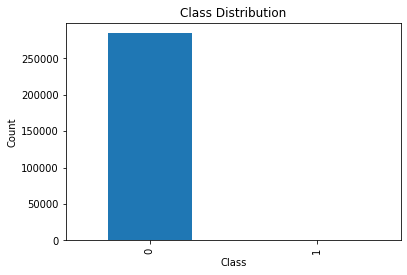

In [6]:
class_counts = df['Class'].value_counts()
print(class_counts)  # print the count of each class

class_counts.plot(kind='bar')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.show()

There are 253038 non fraud transcations and only 466 fraud transactions this Highly Imbalance dataset

Time variable
284802    47.996111
284803    47.996389
284804    47.996667
284805    47.996667
284806    47.997778
Name: Time_Hr, dtype: float64


Text(0, 0.5, '# transactions')

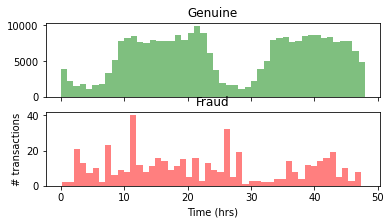

In [7]:
#plot Time to see if there is any trend
print("Time variable")
df["Time_Hr"] = df["Time"]/3600 # convert to hours
print(df["Time_Hr"].tail(5))
fig, (ax1, ax2) = plt.subplots(2, 1, sharex = True, figsize=(6,3))
ax1.hist(df.Time_Hr[df.Class==0],bins=48,color='g',alpha=0.5)
ax1.set_title('Genuine')
ax2.hist(df.Time_Hr[df.Class==1],bins=48,color='r',alpha=0.5)
ax2.set_title('Fraud')
plt.xlabel('Time (hrs)')
plt.ylabel('# transactions')

In [8]:
df[['Time','Amount']].describe()

,Time,Amount
count,284807.000000,284807.000000
mean,94813.859575,88.349619
std,47488.145955,250.120109
min,0.000000,0.000000
25%,54201.500000,5.600000
50%,84692.000000,22.000000
75%,139320.500000,77.165000
max,172792.000000,25691.160000


On an average, credit card transaction is happening at every 94813.86 seconds.
Average transaction amount is 88.35 with a standard deviation of 250, with a minimum amount of 0.0 and the maximum amount 25,691.16. By seeing the 75% and the maximum amount, it looks like the feature 'Amount' is highly positively skewed. We will check the distribution graph of the amount to get more clarity

This "Time" feature shows that rate of transactions is picking up during day time. But number of transactions have almost similar dependence on time of the day for both the classes. So, I believe this feature does not yield any predictive power to distinguish between the two classes. But ofcourse I will later test this assumption. For now, I'll keep this feature in data frame. I will drop "Time" but keep "Time_Hr".

Text(0, 0.5, '# transactions')

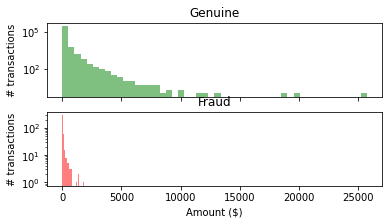

In [9]:
#let us check another feature Amount
fig, (ax3,ax4) = plt.subplots(2,1, figsize = (6,3), sharex = True)
ax3.hist(df.Amount[df.Class==0],bins=50,color='g',alpha=0.5)
ax3.set_yscale('log') # to see the tails
ax3.set_title('Genuine') # to see the tails
ax3.set_ylabel('# transactions')
ax4.hist(df.Amount[df.Class==1],bins=50,color='r',alpha=0.5)
ax4.set_yscale('log') # to see the tails
ax4.set_title('Fraud') # to see the tails
ax4.set_xlabel('Amount ($)')
ax4.set_ylabel('# transactions')

all transaction amounts > 10K in Genuine Class only". Also this amount feature is not on same scale as principle components. So, I'll standardize the values of the 'Amount' feature using StandardScalar and save in data-frame for later use.

In [10]:
df['scaled_Amount'] = StandardScaler().fit_transform(df['Amount'].values.reshape(-1,1))

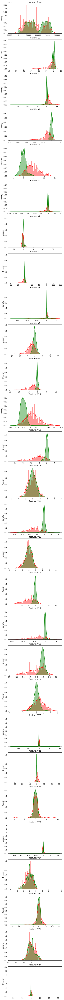

In [11]:
#let us check correlations and shapes of those 25 principal components.
# Features V1, V2, ... V28 are the principal components obtained with PCA.

gs = gridspec.GridSpec(28, 1)
plt.figure(figsize=(6,28*4))
for i, col in enumerate(df[df.iloc[:,0:28].columns]):
    ax5 = plt.subplot(gs[i])
    sns.distplot(df[col][df.Class == 1], bins=50, color='r')
    sns.distplot(df[col][df.Class == 0], bins=50, color='g')
    ax5.set_xlabel('')
    ax5.set_title('feature: ' + str(col))
plt.show()

In [12]:
print("Fraud Transaction distribution : \n",df[(df['Class'] == 1)]['Amount'].value_counts().head())
print("\n")
print("Maximum amount of fraud transaction - ",df[(df['Class'] == 1)]['Amount'].max())
print("Minimum amount of fraud transaction - ",df[(df['Class'] == 1)]['Amount'].min())

Fraud Transaction distribution : 
 1.00     113
0.00      27
99.99     27
0.76      17
0.77      10
Name: Amount, dtype: int64


Maximum amount of fraud transaction -  2125.87
Minimum amount of fraud transaction -  0.0


Highlights

* There are 113 fraud transactions for just one dollor and 27 
fraud transaction for $99.99. And higest fraud transaction amount was 2125.87 and lowest was just 0.00.
* There are 27 fraud transaction for zero amount. Zero Authorization is an account verification method for credit cards that is used to verify a cardholders information without charging the consumer. 
* Instead, an amount of zero is charged on the card to store the credit card information in the form of a token and to determine whether the card is legitimate or not. After creating the token, is then possible to charge the consumer with a new transaction with either Tokenization or Recurring Payments

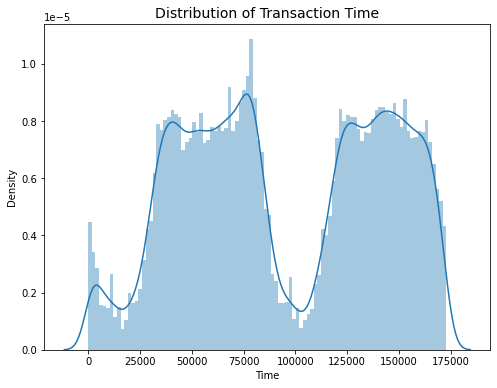

In [13]:
plt.figure(figsize=(8,6))
plt.title('Distribution of Transaction Time', fontsize=14)
sns.distplot(df['Time'], bins=100)
plt.show()

Highlights

* By seeing the graph, we can see there are two peaks in the graph and even there are some local peaks. We can think of these as the time of the day like the peak is the day time when most people do the transactions and the depth is the night time when most people just sleeps. We already know that data contains a credit card transaction for only two days, so there are two peaks for day time and one depth for one night time.

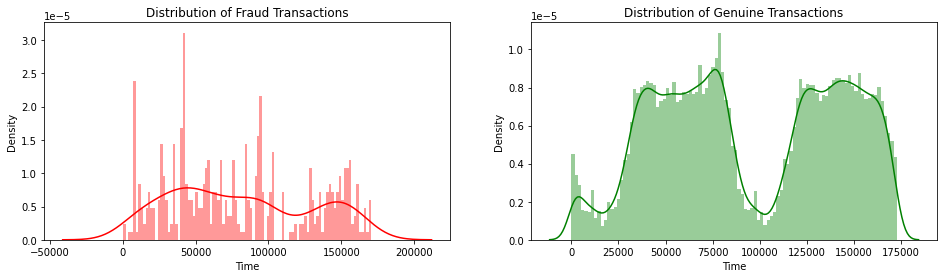

In [14]:
# Distribution of time w.r.t. transactions types¶
fig, axs = plt.subplots(ncols=2, figsize=(16,4))

sns.distplot(df[(df['Class'] == 1)]['Time'], bins=100, color='red', ax=axs[0])
axs[0].set_title("Distribution of Fraud Transactions")

sns.distplot(df[(df['Class'] == 0)]['Time'], bins=100, color='green', ax=axs[1])
axs[1].set_title("Distribution of Genuine Transactions")

plt.show()


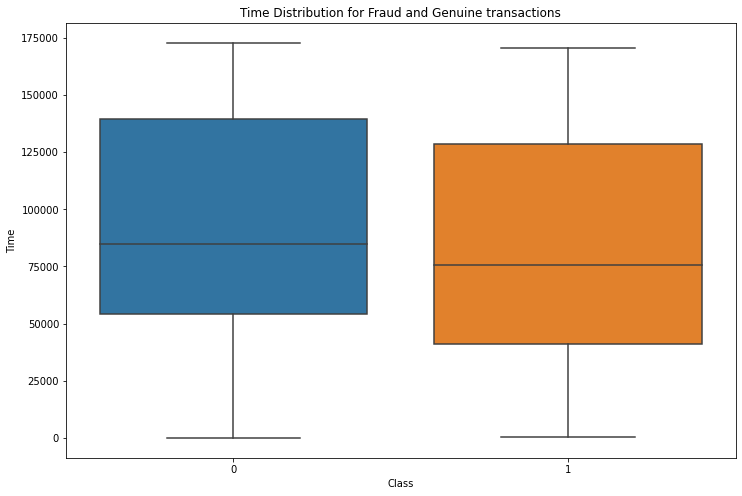

In [15]:
plt.figure(figsize=(12,8))
ax = sns.boxplot(x='Class', y='Time',data = df)
plt.title('Time Distribution for Fraud and Genuine transactions')
plt.show()

In [16]:
fig = px.scatter(df, x="Time", y="Amount", color="Class", 
                 marginal_y="violin",marginal_x="box", trendline="ols", template="simple_white")
fig.show()

## Correlation

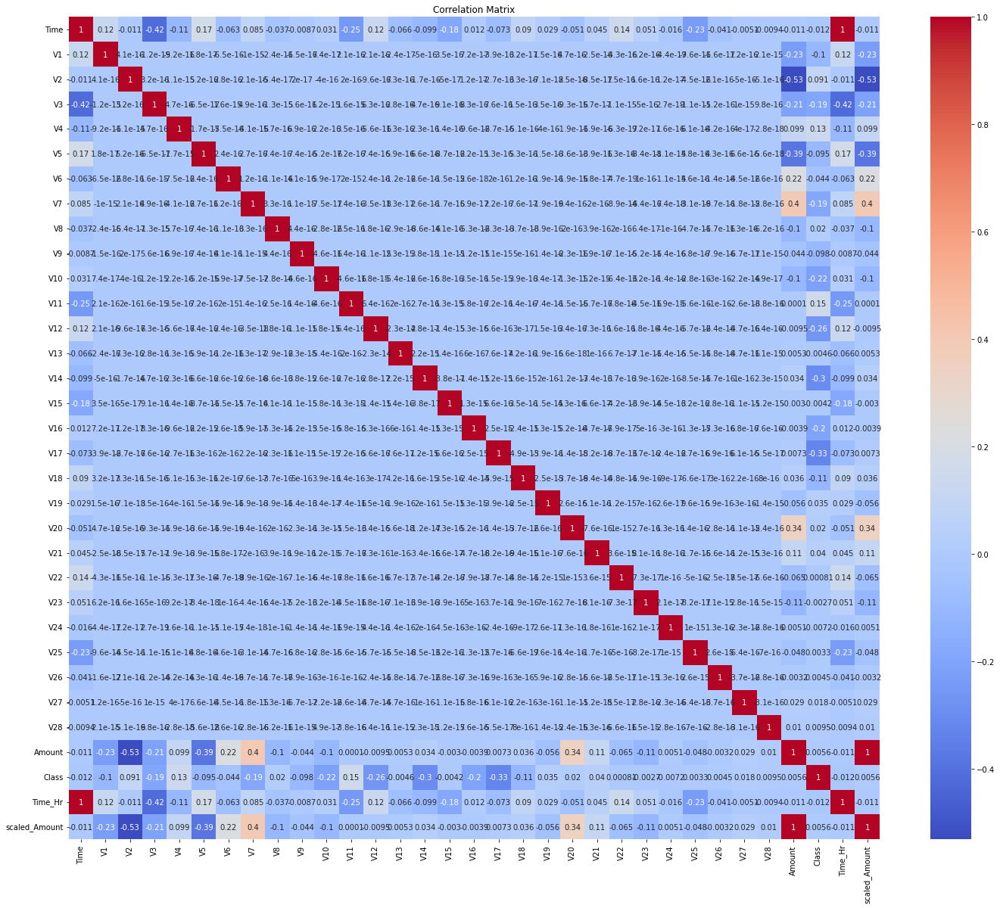

Highly correlated features:  ['Time_Hr', 'scaled_Amount']
Selected features:  ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount', 'Class']


In [17]:

# assuming the data is stored in a pandas DataFrame called 'data'
corr_matrix = df.corr()

# plot the correlation matrix as a heatmap
plt.subplots(figsize=(24,20))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)
plt.title('Correlation Matrix')
plt.show()

# create a list of highly correlated features
high_corr_features = []
corr_threshold = 0.6  # adjust as needed
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > corr_threshold:
            colname = corr_matrix.columns[i]
            high_corr_features.append(colname)
print("Highly correlated features: ", high_corr_features)

# remove highly correlated features
selected_features = [col for col in df.columns if col not in high_corr_features]
print("Selected features: ", selected_features)

For some of the features, both the classes have similar distribution. So, we don't expect them to contribute towards classifying power of the model. So, it's best to drop them and reduce the model complexity, and hence the chances of overfitting. Ofcourse as with my other assumptions, I will later check the validity of above argument.

## Data Pre-processing and cleaning [2M] 
 
1. Do the appropriate pre-processing of the data like identifying NULL or Missing Values if 
any,  handling  of  outliers  if  present  in  the  dataset,  skewed  data  etc.  Mention  the  pre- 
processing steps performed in the markdown cell. 
 
2. Apply appropriate feature engineering techniques for them. Apply the feature 
transformation techniques like Standardization, Normalization, etc. You are free to apply 
the appropriate transformations depending upon the structure and the complexity of your 
dataset. Provide proper justification. Techniques used without justification will not be 
awarded marks 

In [18]:
# check for missing values
print("Missing Values:")
print(df.isnull().sum())

Missing Values:
Time             0
V1               0
V2               0
V3               0
V4               0
V5               0
V6               0
V7               0
V8               0
V9               0
V10              0
V11              0
V12              0
V13              0
V14              0
V15              0
V16              0
V17              0
V18              0
V19              0
V20              0
V21              0
V22              0
V23              0
V24              0
V25              0
V26              0
V27              0
V28              0
Amount           0
Class            0
Time_Hr          0
scaled_Amount    0
dtype: int64


In [19]:
df = df.dropna()
# Dropping all null Values

# Outlier Detection

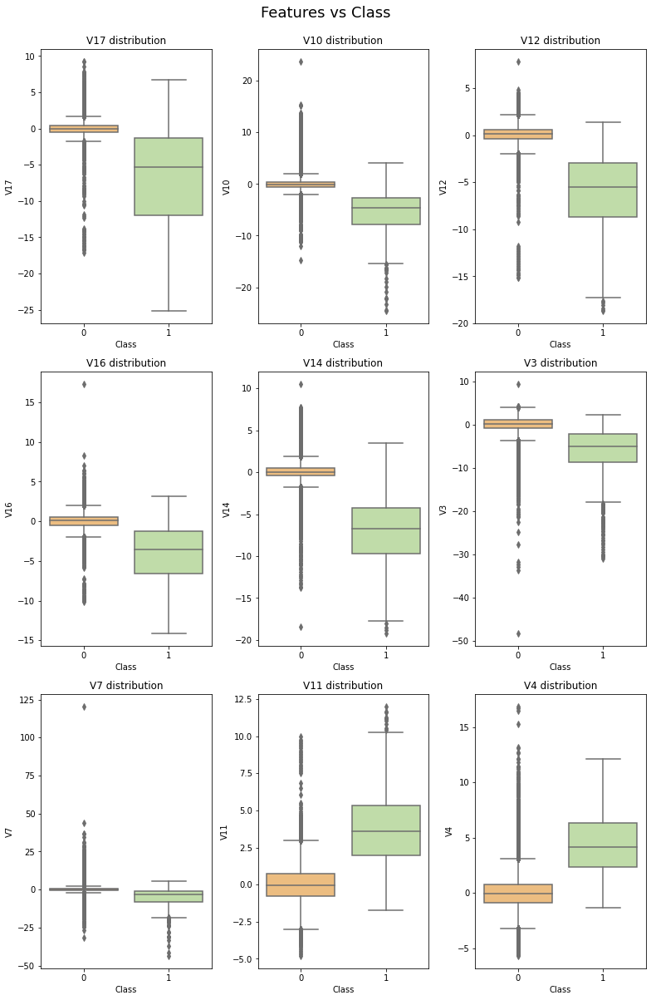

In [20]:
fig, axes = plt.subplots(nrows=3, ncols=3,figsize=(11,17))
fig.suptitle('Features vs Class\n', size = 18)

sns.boxplot(ax=axes[0, 0], data=df, x='Class', y='V17', palette='Spectral')
axes[0,0].set_title("V17 distribution");

sns.boxplot(ax=axes[0, 1], data=df, x='Class', y='V10', palette='Spectral')
axes[0,1].set_title("V10 distribution");

sns.boxplot(ax=axes[0, 2], data=df, x='Class', y='V12', palette='Spectral')
axes[0,2].set_title("V12 distribution");

sns.boxplot(ax=axes[1, 0], data=df, x='Class', y='V16', palette='Spectral')
axes[1,0].set_title("V16 distribution");

sns.boxplot(ax=axes[1, 1], data=df, x='Class', y='V14', palette='Spectral')
axes[1,1].set_title("V14 distribution");

sns.boxplot(ax=axes[1, 2], data=df, x='Class', y='V3', palette='Spectral')
axes[1,2].set_title("V3 distribution");

sns.boxplot(ax=axes[2, 0], data=df, x='Class', y='V7', palette='Spectral')
axes[2,0].set_title("V7 distribution");

sns.boxplot(ax=axes[2, 1], data=df, x='Class', y='V11', palette='Spectral')
axes[2,1].set_title("V11 distribution");

sns.boxplot(ax=axes[2, 2], data=df, x='Class', y='V4', palette='Spectral')
axes[2,2].set_title("V4 distribution");

plt.tight_layout()

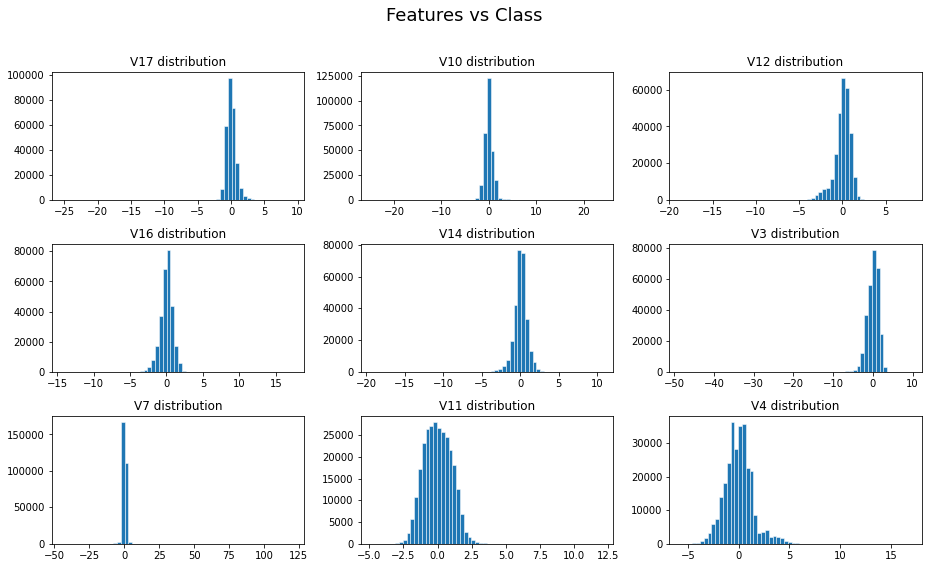

In [21]:
fig, axes = plt.subplots(nrows=3, ncols=3,figsize=(13,8))
fig.suptitle('Features vs Class\n', size = 18)

axes[0,0].hist(df['V17'], bins=60, linewidth=0.5, edgecolor="white")
axes[0,0].set_title("V17 distribution");

axes[0,1].hist(df['V10'], bins=60, linewidth=0.5, edgecolor="white")
axes[0,1].set_title("V10 distribution");

axes[0,2].hist(df['V12'], bins=60, linewidth=0.5, edgecolor="white")
axes[0,2].set_title("V12 distribution");

axes[1,0].hist(df['V16'], bins=60, linewidth=0.5, edgecolor="white")
axes[1,0].set_title("V16 distribution");

axes[1,1].hist(df['V14'], bins=60, linewidth=0.5, edgecolor="white")
axes[1,1].set_title("V14 distribution");

axes[1,2].hist(df['V3'], bins=60, linewidth=0.5, edgecolor="white")
axes[1,2].set_title("V3 distribution");

axes[2,0].hist(df['V7'], bins=60, linewidth=0.5, edgecolor="white")
axes[2,0].set_title("V7 distribution");

axes[2,1].hist(df['V11'], bins=60, linewidth=0.5, edgecolor="white")
axes[2,1].set_title("V11 distribution");

axes[2,2].hist(df['V4'], bins=60, linewidth=0.5, edgecolor="white")
axes[2,2].set_title("V4 distribution");

plt.tight_layout()

In [22]:
def z_score_method (df,n,features):
    """
    Takes a dataframe df of features and returns an index list corresponding to the observations 
    containing more than n outliers according to the z-score method.
    """
    outlier_list = []
    
    for column in features:
        # calculate the mean and standard deviation of the data frame
        data_mean = df[column].mean()
        data_std = df[column].std()
        threshold = 3
        
        z_score = abs( (df[column] - data_mean)/data_std )
        
        # Determining a list of indices of outliers for feature column        
        outlier_list_column =  df[z_score > threshold].index
        
        # appending the found outlier indices for column to the list of outlier indices 
        outlier_list.extend(outlier_list_column)
        
    # selecting observations containing more than x outliers
    outlier_list = Counter(outlier_list)        
    multiple_outliers = list( k for k, v in outlier_list.items() if v > n )
    
    # Calculate the number of outlier records
    df1 = df[z_score > threshold]
    print('Total number of outliers is:', df1.shape[0])
    
    return multiple_outliers

In [23]:
# detecting outliers
Outliers_IQR = z_score_method(df,1, df.columns)

# dropping outliers
df_out = df.drop(Outliers_IQR, axis = 0).reset_index(drop=True)

Total number of outliers is: 4076


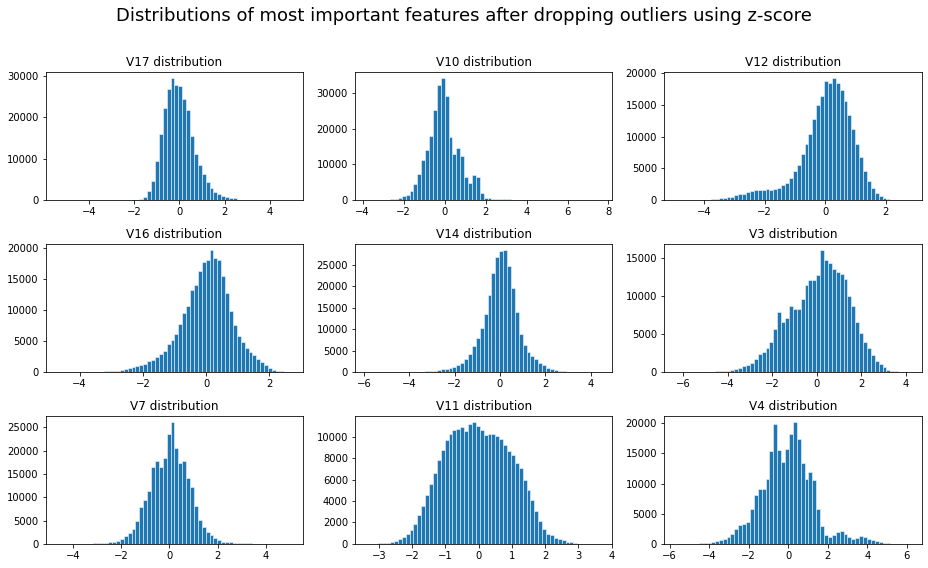

In [24]:

fig, axes = plt.subplots(nrows=3, ncols=3,figsize=(13,8))
fig.suptitle('Distributions of most important features after dropping outliers using z-score\n', size = 18)

axes[0,0].hist(df_out['V17'], bins=60, linewidth=0.5, edgecolor="white")
axes[0,0].set_title("V17 distribution");

axes[0,1].hist(df_out['V10'], bins=60, linewidth=0.5, edgecolor="white")
axes[0,1].set_title("V10 distribution");

axes[0,2].hist(df_out['V12'], bins=60, linewidth=0.5, edgecolor="white")
axes[0,2].set_title("V12 distribution");

axes[1,0].hist(df_out['V16'], bins=60, linewidth=0.5, edgecolor="white")
axes[1,0].set_title("V16 distribution");

axes[1,1].hist(df_out['V14'], bins=60, linewidth=0.5, edgecolor="white")
axes[1,1].set_title("V14 distribution");

axes[1,2].hist(df_out['V3'], bins=60, linewidth=0.5, edgecolor="white")
axes[1,2].set_title("V3 distribution");

axes[2,0].hist(df_out['V7'], bins=60, linewidth=0.5, edgecolor="white")
axes[2,0].set_title("V7 distribution");

axes[2,1].hist(df_out['V11'], bins=60, linewidth=0.5, edgecolor="white")
axes[2,1].set_title("V11 distribution");

axes[2,2].hist(df_out['V4'], bins=60, linewidth=0.5, edgecolor="white")
axes[2,2].set_title("V4 distribution");

plt.tight_layout()

In [25]:
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class', 'Time_Hr', 'scaled_Amount'],
      dtype='object')

In [26]:
from scipy.stats import boxcox

# Apply Box-Cox transformation to the negatively skewed features
for feature in df.columns.difference(['Class']):
    if abs(df[feature].skew()) < 0.5:
        df[feature], _ = boxcox(df[feature] - df[feature].min() + 1)

# Check for skewness again
print(df.skew())

Time             -0.229688
V1               -3.280667
V2               -4.624866
V3               -2.240155
V4                0.676292
V5               -2.425901
V6                1.826581
V7                2.553907
V8               -8.521944
V9                0.554680
V10               1.187141
V11               0.007671
V12              -2.278401
V13               0.008131
V14              -1.995176
V15               0.003387
V16              -1.100966
V17              -3.844914
V18               0.078260
V19               0.051590
V20              -2.037155
V21               3.592991
V22               0.077684
V23              -5.875140
V24              -0.552499
V25               0.127149
V26               0.576693
V27              -1.170209
V28              11.192091
Amount           16.977724
Class            23.997579
Time_Hr          -0.195080
scaled_Amount    16.977724
dtype: float64


# Feature Engineering

In [27]:
# Converting time from second to hour
df['Time'] = df['Time'].apply(lambda sec : (sec/3600))

In [28]:
# Calculating hour of the day
import math
df['hour'] = df['Time']%24   # 2 days of data
df['hour'] = df['hour'].apply(lambda x : math.floor(x))

In [29]:
# Calculating First and Second day
df['day'] = df['Time']/24   # 2 days of data
df['day'] = df['day'].apply(lambda x : 1 if(x==0) else math.ceil(x))

In [30]:
df[['Time','hour','day','Amount','Class']]

,Time,hour,day,Amount,Class
0,0.000000,0,1,149.62,0
1,0.000000,0,1,2.69,0
2,0.000254,0,1,378.66,0
3,0.000254,0,1,123.50,0
4,0.000480,0,1,69.99,0
...,...,...,...,...,...
284802,3.901409,3,1,0.77,0
284803,3.901427,3,1,24.79,0
284804,3.901444,3,1,67.88,0
284805,3.901444,3,1,10.00,0


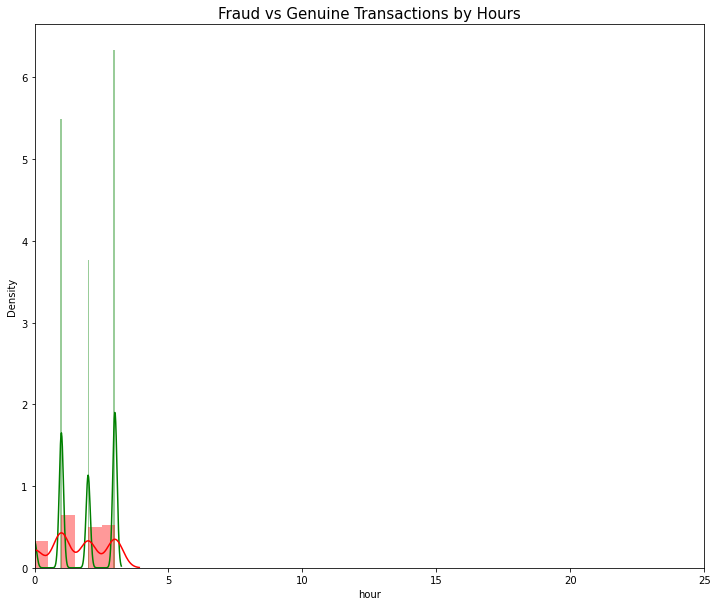

In [31]:
# Let's see if we find any particular pattern between time ( in hours ) and Fraud vs Genuine Transactions

plt.figure(figsize=(12,10))

sns.distplot(df[df['Class'] == 0]["hour"], color='green') # Genuine - green
sns.distplot(df[df['Class'] == 1]["hour"], color='red') # Fraudulent - Red

plt.title('Fraud vs Genuine Transactions by Hours', fontsize=15)
plt.xlim([0,25])
plt.show()

Highlights

* Above graph shows that most of the Fraud transactions are happening at night time (0 to 7 hours) when most of the people are sleeping and Genuine transaction are happening during day time (9 to 21 hours).

In [32]:
df.reset_index(inplace = True , drop = True)


# Scaling and Standardisation

* It is a good idea to scale the data so that the column(feature) with lesser significance might not end up dominating the objective function due to its larger range. like a column like age has a range between 0 to 80, but a column like a salary has ranged from thousands to lakhs, hence, salary column will dominate to predict the outcome even if it may not be important.
* In addition, features having different unit should also be scaled thus providing each feature equal initial weightage. 

* Like Age in years and Sales in Dollars must be brought down to a common scale before feeding it to the ML algorithm
This will result in a better prediction model.

## Scale amount by Log
Scaling using the log: There are two main reasons to use logarithmic scales in charts and graphs.

The first is to respond to skewness towards large values; i.e., cases in which one or a few points are much larger than the bulk of the data.
The second is to show per cent change or multiplicative factors. 

In [33]:
# Scale amount by log
# Adding a small amount of 0.0001 to amount as log of zero is infinite.
df['amount_log'] = np.log(df.Amount + 0.0001)

In [34]:
from sklearn.preprocessing import StandardScaler # importing a class from a module of a library

ss = StandardScaler() # object of the class StandardScaler ()
df['amount_scaled'] = ss.fit_transform(df['Amount'].values.reshape(-1,1))

In [35]:
from sklearn.preprocessing import MinMaxScaler

mm = MinMaxScaler() # object of the class StandardScaler ()
df['amount_minmax'] = mm.fit_transform(df['Amount'].values.reshape(-1,1))

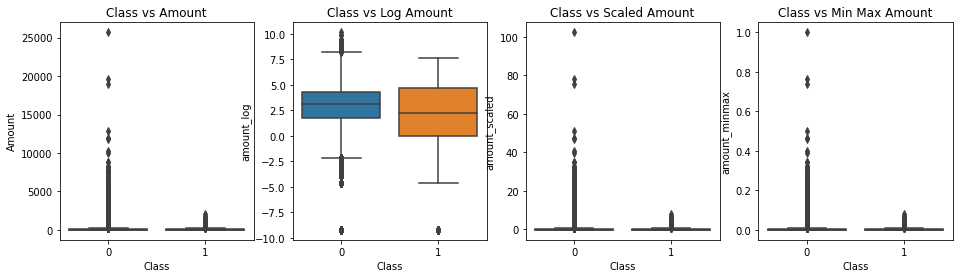

In [36]:
# Feature engineering to a better visualization of the values

# Let's explore the Amount by Class and see the distribuition of Amount transactions
fig , axs = plt.subplots(nrows = 1 , ncols = 4 , figsize = (16,4))

sns.boxplot(x ="Class",y="Amount",data=df, ax = axs[0])
axs[0].set_title("Class vs Amount")

sns.boxplot(x ="Class",y="amount_log",data=df, ax = axs[1])
axs[1].set_title("Class vs Log Amount")

sns.boxplot(x ="Class",y="amount_scaled",data=df, ax = axs[2])
axs[2].set_title("Class vs Scaled Amount")

sns.boxplot(x ="Class",y="amount_minmax",data=df, ax = axs[3])
axs[3].set_title("Class vs Min Max Amount")

# fig.suptitle('Amount by Class', fontsize=20)
plt.show()

We can see a slight difference in the log amount of our two Classes.
* The IQR of fraudulent transactions are higher than normal transactions, but normal transactions have the highest values.
* By seeing the above three graphs, I think scaling the amount by log will best suit for our model.

In [37]:
scaler = StandardScaler()
features = list(df.columns.difference(['Class']))
# Fit the scaler to the data and transform the features
df[features] = scaler.fit_transform(df[features])

In [38]:
# Separate Target Variable and Predictor Variables
# Here I am keeping the log amount and dropping the amount and scaled amount columns.
X = df.drop(['Time','Class','hour','day','Amount','amount_minmax','amount_scaled'],axis=1)
y = df['Class']

In [39]:
# Splitting the data

In [40]:
def split_data(df, drop_list, test_size=0.2, model='' ):
    df = df.drop(drop_list,axis=1)
    print(df.columns)
    #test train split time
    from sklearn.model_selection import train_test_split
    y = df['Class'].values #target

    if model == 'Multinomial':
      from sklearn.preprocessing import KBinsDiscretizer
      # Define the feature and target columns
      X = df.drop('Class', axis=1)
      y = df['Class']

      # Create a KBinsDiscretizer object
      n_bins = 10 # number of bins to use
      discretizer = KBinsDiscretizer(n_bins=n_bins, encode='ordinal', strategy='uniform')

      # Fit the discretizer to the data and transform X
      X = discretizer.fit_transform(X)
    else:
      X = df.drop(['Class'],axis=1).values #features

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,
                                                    random_state=42, stratify=y)
    

    print("train-set size: ", len(y_train),
      "\ntest-set size: ", len(y_test))
    print("fraud cases in test-set: ", sum(y_test))
    return X_train, X_test, y_train, y_test

In [41]:
def get_predictions(clf, X_train, y_train, X_test):
    # create classifier
    clf = clf
    # fit it to training data
    clf.fit(X_train,y_train)
    # predict using test data
    y_pred = clf.predict(X_test)
    # Compute predicted probabilities: y_pred_prob
    y_pred_prob = clf.predict_proba(X_test)
    #for fun: train-set predictions
    train_pred = clf.predict(X_train)
    print('train-set confusion matrix:\n', confusion_matrix(y_train,train_pred)) 

    visualizer = ROCAUC(clf, classes=["not fraud", "fraud"])

    visualizer.fit(X_train, y_train)        # Fit the training data to the visualizer
    visualizer.score(X_test, y_test)        # Evaluate the model on the test data
    visualizer.show() 
    
    return y_pred, y_pred_prob

In [42]:
def print_scores(y_test,y_pred,y_pred_prob):
    print('test-set confusion matrix:\n', confusion_matrix(y_test,y_pred)) 
    print("recall score: ", recall_score(y_test,y_pred))
    print("precision score: ", precision_score(y_test,y_pred))
    print("f1 score: ", f1_score(y_test,y_pred))
    print("accuracy score: ", accuracy_score(y_test,y_pred))
    print("ROC AUC: {}".format(roc_auc_score(y_test, y_pred_prob[:,1])))
    # Heatmap for Confusion Matrix
    p = sns.heatmap(pd.DataFrame(confusion_matrix(y_test,y_pred)), annot=True, annot_kws={"size": 25}, cmap="winter" ,fmt='g')

    plt.title('Confusion matrix', y=1.1, fontsize = 22)
    plt.ylabel('Actual',fontsize = 18)
    plt.xlabel('Predicted',fontsize = 18)

    # ax.xaxis.set_ticklabels(['Genuine', 'Fraud']); 
    # ax.yaxis.set_ticklabels(['Genuine', 'Fraud']);

    plt.show()
  

### 3.  Model Building [4M] 
 
1. Split the dataset into training and test sets. Answer without justification will not be 
awarded marks. [1M] 
Case 1 : Train = 80 % Test = 20% [ x_train1,y_train1] = 80% ; 
[ x_test1,y_test1] = 20% ; 
 
Also, try to split the dataset with different ratios of your choice. 
 
2. Model the classifier using GaussianNB, BernoulliNB, and MultinomialNB  [3M] 

# GaussianNB

*Test Size 0.2*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  227845 
test-set size:  56962
fraud cases in test-set:  98
train-set confusion matrix:
 [[223932   3519]
 [    60    334]]


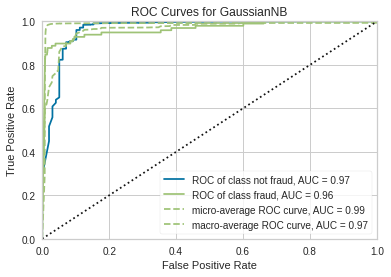

test-set confusion matrix:
 [[55929   935]
 [   12    86]]
recall score:  0.8775510204081632
precision score:  0.0842311459353575
f1 score:  0.15370866845397677
accuracy score:  0.9833748814999473
ROC AUC: 0.9644210174221629


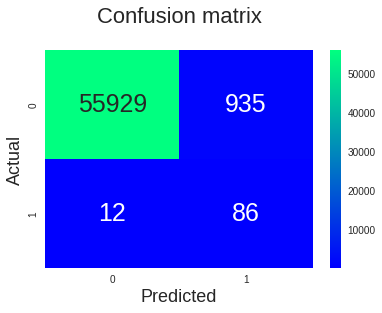

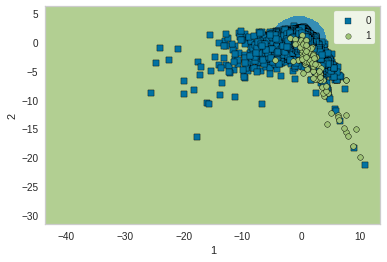

***Test Size:0.2*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            55929
        1              935
1       1               86
        0               12
dtype: int64
**************************************************
*Test Size 0.3*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  199364 
test-set size:  85443
fraud cases in test-set:  148
train-set confusion matrix:
 [[196010   3010]
 [    47    297]]


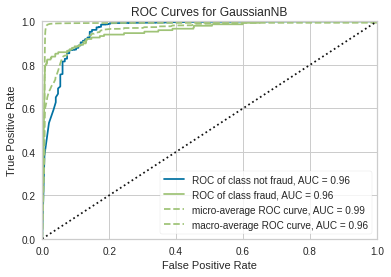

test-set confusion matrix:
 [[83991  1304]
 [   26   122]]
recall score:  0.8243243243243243
precision score:  0.08555399719495091
f1 score:  0.15501905972045743
accuracy score:  0.9844340671558817
ROC AUC: 0.9587797437510199


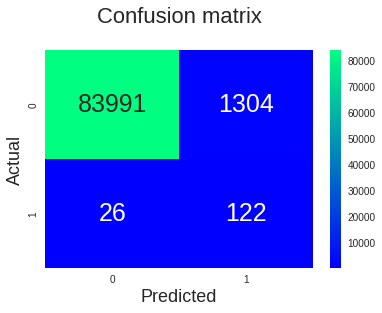

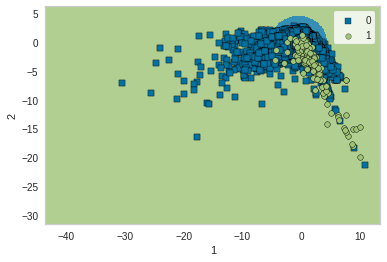

***Test Size:0.3*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            83991
        1             1304
1       1              122
        0               26
dtype: int64
**************************************************
*Test Size 0.1*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  256326 
test-set size:  28481
fraud cases in test-set:  49
train-set confusion matrix:
 [[251899   3984]
 [    66    377]]


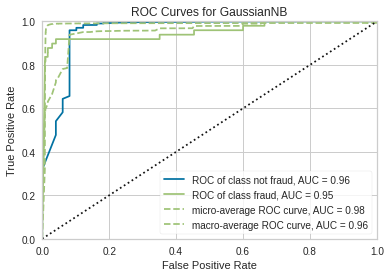

test-set confusion matrix:
 [[27946   486]
 [    6    43]]
recall score:  0.8775510204081632
precision score:  0.08128544423440454
f1 score:  0.14878892733564014
accuracy score:  0.9827253256557003
ROC AUC: 0.9521475514797928


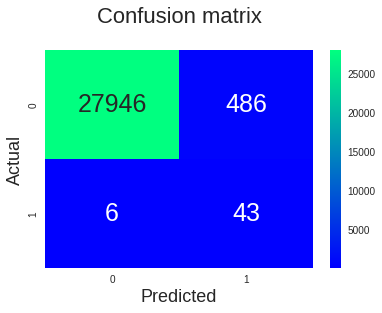

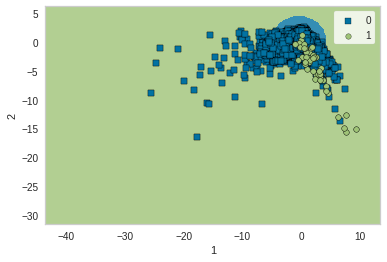

***Test Size:0.1*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            27946
        1              486
1       1               43
        0                6
dtype: int64
**************************************************


In [45]:
from yellowbrick.classifier import ROCAUC

drop_list = ['V28','V27','V26','V25','V24','V23','V22','V20','V15','V13','V8','Time','hour','day','Amount','amount_minmax','amount_scaled']
title="GaussianNB"
for test_size in [0.2,0.3,0.1]:
  print(f"*Test Size {test_size}*")
  X_train, X_test, y_train, y_test = split_data(df, drop_list, test_size)
  y_pred, y_pred_prob = get_predictions(GaussianNB(), X_train, y_train, X_test)
  print_scores(y_test,y_pred,y_pred_prob)
  viz = DecisionViz(
    GaussianNB(), title="GaussianNB",
    features=[1,2], classes=['0', '1'])
  viz.fit(X_train, y_train)
  viz.draw(X_test, y_test)
  viz.show()
  actual = y_test
  predicted = y_pred
  # Create DataFrame
  output_df = pd.DataFrame({'Actual': actual, 'Predicted': predicted})
  print(f'***Test Size:{test_size}*****Justification for Actual and Predicted*********')
  print(output_df.value_counts())
  # Save to CSV file
  output_df.to_csv("/content/drive/MyDrive/Data/"+str(title)+"test_size_"+str(test_size)+'_predictions.csv', index=False)
  print("*"*50)

In [ ]:
# Gaussian NB is with has better results with train split 70 and 30
# with 83991 actual non-fraud and 122 actual fraud
# Actual non fraud predicted 1304 fraud
# Actual fraud predicted 26 as non fraud
# recall score:  0.8243243243243243
# precision score:  0.08555399719495091
# f1 score:  0.15501905972045743
# accuracy score:  0.9844340671558817
# ROC AUC: 0.9587797437510199

# BernoulliNB

*Test Size 0.2*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  227845 
test-set size:  56962
fraud cases in test-set:  98
train-set confusion matrix:
 [[227406     45]
 [   153    241]]


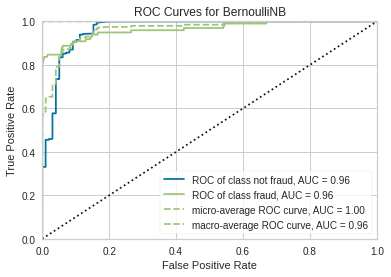

test-set confusion matrix:
 [[56847    17]
 [   35    63]]
recall score:  0.6428571428571429
precision score:  0.7875
f1 score:  0.7078651685393258
accuracy score:  0.9990871107053826
ROC AUC: 0.9644098019765024


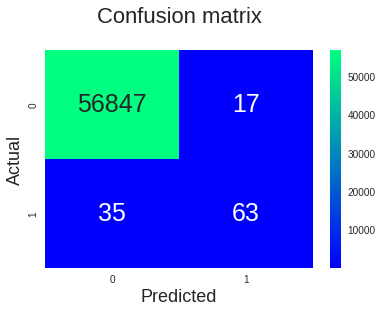

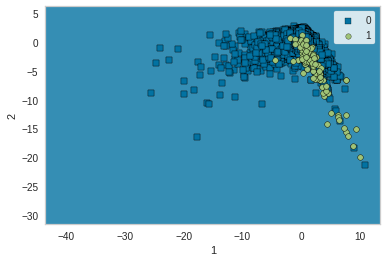

***Test Size:0.2*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            56847
1       1               63
        0               35
0       1               17
dtype: int64
**************************************************
*Test Size 0.3*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  199364 
test-set size:  85443
fraud cases in test-set:  148
train-set confusion matrix:
 [[198980     40]
 [   121    223]]


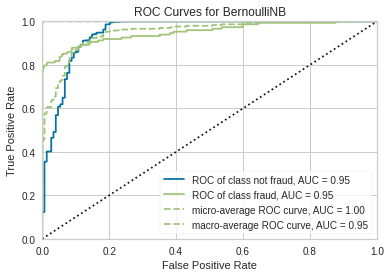

test-set confusion matrix:
 [[85273    22]
 [   62    86]]
recall score:  0.581081081081081
precision score:  0.7962962962962963
f1 score:  0.6718749999999999
accuracy score:  0.9990168884519505
ROC AUC: 0.9500089514451434


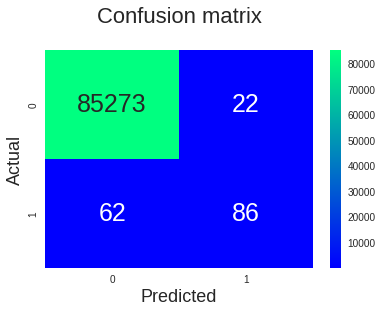

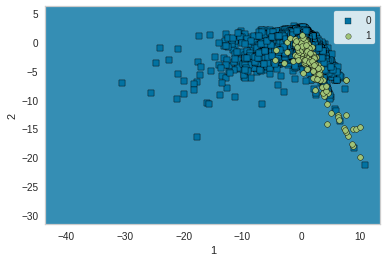

***Test Size:0.3*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            85273
1       1               86
        0               62
0       1               22
dtype: int64
**************************************************
*Test Size 0.1*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  256326 
test-set size:  28481
fraud cases in test-set:  49
train-set confusion matrix:
 [[255829     54]
 [   166    277]]


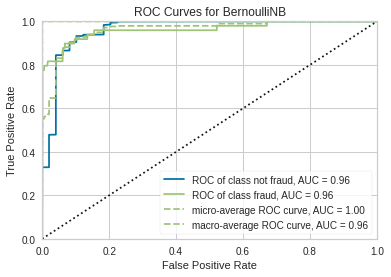

test-set confusion matrix:
 [[28424     8]
 [   18    31]]
recall score:  0.6326530612244898
precision score:  0.7948717948717948
f1 score:  0.7045454545454547
accuracy score:  0.9990871107053826
ROC AUC: 0.96204047178804


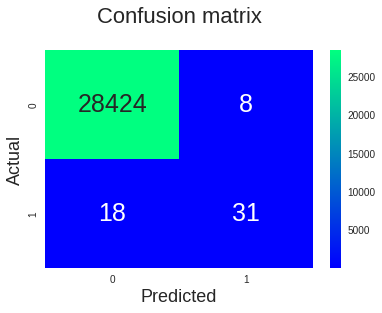

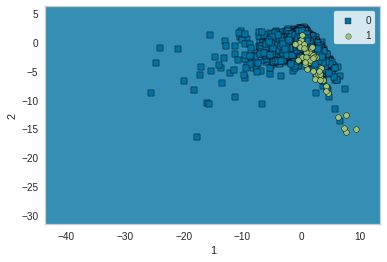

***Test Size:0.1*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            28424
1       1               31
        0               18
0       1                8
dtype: int64
**************************************************


In [46]:
drop_list = ['V28','V27','V26','V25','V24','V23','V22','V20','V15','V13','V8','Time','hour','day','Amount','amount_minmax','amount_scaled']
title="BernoulliNB"
for test_size in [0.2,0.3,0.1]:
  print(f"*Test Size {test_size}*")
  X_train, X_test, y_train, y_test = split_data(df, drop_list, test_size)
  y_pred, y_pred_prob = get_predictions(BernoulliNB(), X_train, y_train, X_test)
  print_scores(y_test,y_pred,y_pred_prob)
  viz = DecisionViz(
    BernoulliNB(), title="BernoulliNB",
    features=[1,2], classes=['0', '1'])
  viz.fit(X_train, y_train)
  viz.draw(X_test, y_test)
  viz.show()
  actual = y_test
  predicted = y_pred
  # Create DataFrame
  output_df = pd.DataFrame({'Actual': actual, 'Predicted': predicted})
  print(f'***Test Size:{test_size}*****Justification for Actual and Predicted*********')
  print(output_df.value_counts())
  # Save to CSV file
  output_df.to_csv("/content/drive/MyDrive/Data/"+str(title)+"test_size_"+str(test_size)+'_predictions.csv', index=False)
  print("*"*50)

# MultinomialNB

*Test Size 0.2*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  227845 
test-set size:  56962
fraud cases in test-set:  98
train-set confusion matrix:
 [[227435     16]
 [   308     86]]


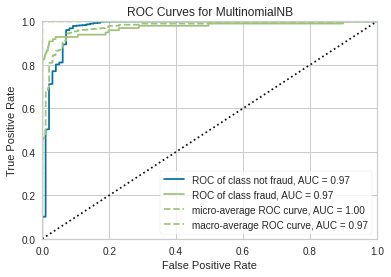

test-set confusion matrix:
 [[56857     7]
 [   75    23]]
recall score:  0.23469387755102042
precision score:  0.7666666666666667
f1 score:  0.359375
accuracy score:  0.9985604438046417
ROC AUC: 0.9733416931769894


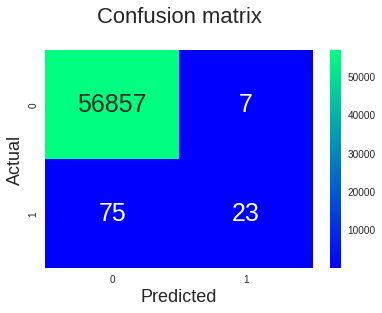

***Test Size:0.2*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            56857
1       0               75
        1               23
0       1                7
dtype: int64
**************************************************
*Test Size 0.3*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  199364 
test-set size:  85443
fraud cases in test-set:  148
train-set confusion matrix:
 [[199005     15]
 [   262     82]]


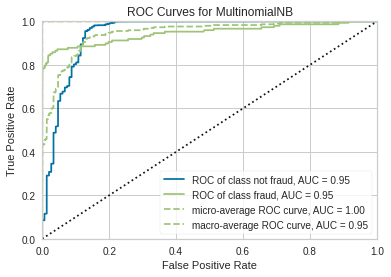

test-set confusion matrix:
 [[85287     8]
 [  117    31]]
recall score:  0.20945945945945946
precision score:  0.7948717948717948
f1 score:  0.33155080213903737
accuracy score:  0.998537036386831
ROC AUC: 0.946250691162468


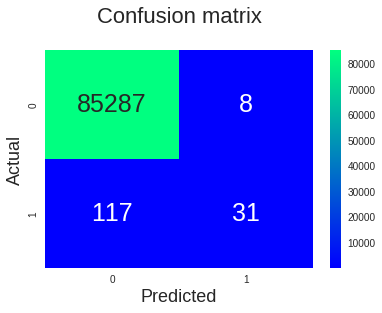

***Test Size:0.3*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            85287
1       0              117
        1               31
0       1                8
dtype: int64
**************************************************
*Test Size 0.1*
Index(['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       'V14', 'V16', 'V17', 'V18', 'V19', 'V21', 'Class', 'Time_Hr',
       'scaled_Amount', 'amount_log'],
      dtype='object')
train-set size:  256326 
test-set size:  28481
fraud cases in test-set:  49
train-set confusion matrix:
 [[255864     19]
 [   347     96]]


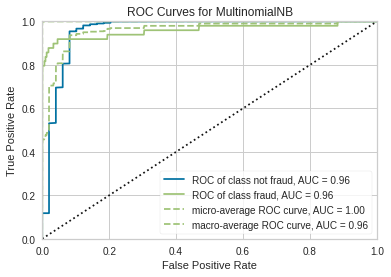

test-set confusion matrix:
 [[28428     4]
 [   36    13]]
recall score:  0.2653061224489796
precision score:  0.7647058823529411
f1 score:  0.3939393939393939
accuracy score:  0.9985955549313578
ROC AUC: 0.9595264174887737


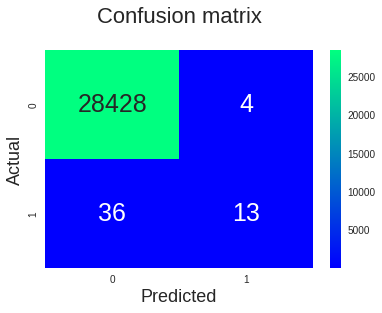

***Test Size:0.1*****Justification for Actual and Predicted*********
Actual  Predicted
0       0            28428
1       0               36
        1               13
0       1                4
dtype: int64
**************************************************


In [47]:
drop_list = ['V28','V27','V26','V25','V24','V23','V22','V20','V15','V13','V8','Time','hour','day','Amount','amount_minmax','amount_scaled']
title="MultinomialNB"
for test_size in [0.2,0.3,0.1]:
  print(f"*Test Size {test_size}*")
  X_train, X_test, y_train, y_test = split_data(df, drop_list, test_size, model = 'Multinomial')
  y_pred, y_pred_prob = get_predictions(MultinomialNB(), X_train, y_train, X_test)
  print_scores(y_test,y_pred,y_pred_prob)
  actual = y_test
  predicted = y_pred
  # Create DataFrame
  output_df = pd.DataFrame({'Actual': actual, 'Predicted': predicted})
  print(f'***Test Size:{test_size}*****Justification for Actual and Predicted*********')
  print(output_df.value_counts())
  # Save to CSV file
  output_df.to_csv("/content/drive/MyDrive/Data/"+str(title)+"test_size_"+str(test_size)+'_predictions.csv', index=False)
  print("*"*50)

In [50]:
# Gaussian NB is with has better results with train split 70 and 30
# with 83991 actual non-fraud and 122 actual fraud
# Actually non fraud and predicted 1304 fraud
# Actually fraud but predicted 26 as non fraud
# recall score:  0.8243243243243243
# precision score:  0.08555399719495091
# f1 score:  0.15501905972045743
# accuracy score:  0.9844340671558817
# ROC AUC: 0.9587797437510199

# The classification performance measures listed in the comment refer to the evaluation of a binary classification problem, where the goal is to predict whether a credit card transaction is fraudulent or not.
# Recall score: It measures the proportion of actual positive cases that were correctly identified by the model. In other words, it represents the ability of the model to detect fraudulent transactions. The value of 0.824 indicates that the model correctly identified 82.4% of the fraudulent transactions in the test set.
# Precision score: It measures the proportion of positive predictions that were correctly identified. In other words, it represents the accuracy of the model in predicting fraudulent transactions. The value of 0.085 indicates that out of all the transactions predicted as fraudulent, only 8.5% of them were actually fraudulent.
# F1 score: It is the harmonic mean of precision and recall scores, and provides a balance between the two. The value of 0.155 indicates that the model achieved a relatively low F1 score, which is mainly due to the low precision score.
# Accuracy score: It measures the proportion of correct predictions among all the predictions made by the model. The value of 0.984 indicates that the model correctly predicted 98.4% of all transactions in the test set, regardless of their class.
# ROC AUC: It is a measure of the overall performance of a binary classifier, taking into account both its true positive rate (TPR) and false positive rate (FPR). The value of 0.958 indicates that the model achieved a relatively high ROC AUC, which means it has a good ability to distinguish between positive and negative classes.
# Overall, the model has achieved a high accuracy and ROC AUC score, indicating a good performance in predicting non-fraudulent transactions. However, the precision score is relatively low, which means that the model tends to falsely predict some non-fraudulent transactions as fraudulent. This may have practical implications in terms of incurring costs for further investigation of the falsely predicted transactions. Therefore, the model could be further improved by adjusting the decision threshold or using a different classification algorithm that better balances between precision and recall.